In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.metrics import r2_score
from keras.utils import to_categorical
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import tensorflow as tf
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error

**Data Exploration and Preprocessing**

Load the dataset and explore its structure and features.

In [2]:
df = pd.read_csv('/content/AmesHousing.csv')
df

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,RL,37.0,7937,Pave,NaN,IR1,Lvl,...,0,NaN,GdPrv,NaN,0,3,2006,WD,Normal,142500
2926,2927,923276100,20,RL,NaN,8885,Pave,NaN,IR1,Low,...,0,NaN,MnPrv,NaN,0,6,2006,WD,Normal,131000
2927,2928,923400125,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,132000
2928,2929,924100070,20,RL,77.0,10010,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,170000


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

**Data Exploration and Preprocessing**

Handle missing values, outliers, and perform necessary data transformations.


In [38]:
object_columns = df.select_dtypes(include='object').columns

for column in object_columns:
    label_encoder = LabelEncoder()
    df[column] = label_encoder.fit_transform(df[column])

df

,Order,PID,MS SubClass,MS Zoning,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,...,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice,Cluster
0,1,526301100,20,5,31770,1,2,0,3,0,...,4,4,5,0,5,2010,9,4,215000,13
1,2,526350040,20,4,11622,1,2,3,3,0,...,4,2,5,0,6,2010,9,4,105000,3
2,3,526351010,20,5,14267,1,2,0,3,0,...,4,4,1,12500,6,2010,9,4,172000,3
3,4,526353030,20,5,11160,1,2,3,3,0,...,4,4,5,0,4,2010,9,4,244000,1
4,5,527105010,60,5,13830,1,2,0,3,0,...,4,2,5,0,3,2010,9,4,189900,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,5,7937,1,2,0,3,0,...,4,0,5,0,3,2006,9,4,142500,3
2926,2927,923276100,20,5,8885,1,2,0,2,0,...,4,2,5,0,6,2006,9,4,131000,3
2927,2928,923400125,85,5,10441,1,2,3,3,0,...,4,2,3,700,7,2006,9,4,132000,3
2928,2929,924100070,20,5,10010,1,2,3,3,0,...,4,4,5,0,4,2006,9,4,170000,13


In [5]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
df_numeric = df[numeric_columns]

for column in df_numeric:
    z_scores = (df_numeric[column] - df_numeric[column].mean()) / df_numeric[column].std()
    dfhandled = df_numeric[z_scores < 5]

dfhandled = dfhandled.dropna(axis=1)

df = dfhandled

In [6]:
dfhandled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2921 entries, 0 to 2929
Data columns (total 71 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Order            2921 non-null   int64
 1   PID              2921 non-null   int64
 2   MS SubClass      2921 non-null   int64
 3   MS Zoning        2921 non-null   int64
 4   Lot Area         2921 non-null   int64
 5   Street           2921 non-null   int64
 6   Alley            2921 non-null   int64
 7   Lot Shape        2921 non-null   int64
 8   Land Contour     2921 non-null   int64
 9   Utilities        2921 non-null   int64
 10  Lot Config       2921 non-null   int64
 11  Land Slope       2921 non-null   int64
 12  Neighborhood     2921 non-null   int64
 13  Condition 1      2921 non-null   int64
 14  Condition 2      2921 non-null   int64
 15  Bldg Type        2921 non-null   int64
 16  House Style      2921 non-null   int64
 17  Overall Qual     2921 non-null   int64
 18  Overall Cond 

**Neighborhood Clustering**

Use K-means or K-medoids clustering to group similar neighborhoods based on
features like crime rate, schools, accessibility, etc. You can use hierarchical
clustering to figure out cluster size.

In [7]:
features = ['Street', 'Alley', 'Year Built', 'Sale Type', 'Garage Finish', 'Bsmt Qual', 'Central Air', 'Fireplaces', 'Kitchen AbvGr', 'House Style', 'Lot Area', '2nd Flr SF', 'TotRms AbvGrd', '1st Flr SF', 'Fireplace Qu', 'Heating', 'Bedroom AbvGr', 'Kitchen Qual', 'MS Zoning', 'Garage Type', 'Sale Condition', 'Overall Qual', 'Half Bath', 'Wood Deck SF', 'Electrical', 'Full Bath', 'Bldg Type', 'Year Remod/Add', 'MS SubClass', 'Exter Qual', 'Gr Liv Area', 'Foundation', 'Heating QC']

df = df.dropna(subset=features)

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df[features])

kmeans = KMeans(n_clusters=15, random_state=42)
clusters = kmeans.fit_predict(df_scaled)

df['Cluster'] = clusters

cluster_means = df.groupby('Cluster')[features].mean()
print(cluster_means)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


         Street     Alley   Year Built  Sale Type  Garage Finish  Bsmt Qual  \
Cluster                                                                       
0          1.00  1.994565  1992.516304   8.157609       0.532609   1.309783   
1          1.00  1.981579  2001.705263   8.092105       0.618421   1.410526   
2          1.00  0.109091  1920.100000   8.827273       2.054545   3.636364   
3          1.00  1.994975  1955.319933   8.902848       1.824121   3.462312   
4          1.00  2.000000  1999.515337   8.226994       0.453988   1.564417   
5          1.00  1.804124  1952.237113   0.463918       1.680412   3.453608   
6          1.00  1.982249  1940.195266   8.899408       1.917160   3.650888   
7          0.00  2.000000  1939.909091   7.909091       1.909091   3.181818   
8          1.00  2.000000  1974.021898   8.715328       1.795620   2.948905   
9          1.00  1.997630  1994.409953   8.651659       0.625592   2.220379   
10         1.00  1.776860  1949.958678   8.396694   

**Neighborhood Clustering**

Visualize the clusters on a map (if geographical data is available).

In [ ]:
cluster_df = df[features + ['Cluster']]

sns.pairplot(cluster_df, hue='Cluster', palette='tab10', height=2.5)
plt.suptitle('Pairwise Plot with Clusters')
plt.show()

**Feature Selection**

Employ techniques like correlation analysis, forward/backward selection, or
LASSO regression to select the most relevant features for house price prediction.

In [10]:
correlation_matrix = df[features + ['SalePrice']].corr()

correlation_with_saleprice = correlation_matrix['SalePrice'].drop('SalePrice')

correlation_with_saleprice_sorted = correlation_with_saleprice.abs().sort_values(ascending=False)

print(correlation_with_saleprice_sorted)

Overall Qual      0.805031
Gr Liv Area       0.695656
Exter Qual        0.643632
Bsmt Qual         0.620199
Kitchen Qual      0.615804
1st Flr SF        0.611796
Year Built        0.572118
Garage Finish     0.559283
Full Bath         0.548631
Year Remod/Add    0.547824
TotRms AbvGrd     0.488713
Fireplace Qu      0.483501
Fireplaces        0.471793
Heating QC        0.433118
Garage Type       0.429270
Foundation        0.413981
Wood Deck SF      0.323612
Half Bath         0.278574
Central Air       0.274167
2nd Flr SF        0.257779
Lot Area          0.256502
Sale Condition    0.243963
Electrical        0.239490
House Style       0.170401
MS Zoning         0.145754
Alley             0.144997
Bedroom AbvGr     0.143198
Kitchen AbvGr     0.122592
Heating           0.090873
MS SubClass       0.083726
Street            0.061615
Bldg Type         0.048462
Sale Type         0.046518
Name: SalePrice, dtype: float64


**Feature Selection**

**Scatter Plot for Selected Features**

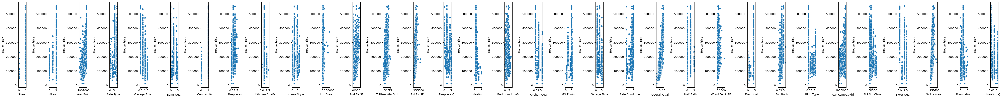

In [43]:
selected_features = features

fig, axes = plt.subplots(nrows=1, ncols=len(selected_features), figsize=(50, 5))

for i, feature in enumerate(selected_features):
    sns.scatterplot(x=df[feature], y=df['SalePrice'], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('House Price')

plt.tight_layout()
plt.show()


**Feature Selection**

**Explain why certain features were chosen or discarded.**

Certain features were chosen based on their strong correlation (above 0.4) with the target variable, 'SalePrice', indicating a significant impact on predicting property sale prices.

Features such as 'Overall Quality', 'Ground Living Area', 'Exterior Quality', 'Basement Quality', 'Kitchen Quality', 'Year Built', and 'Year Remodeled' were selected due to their substantial influence on property values.

Features with weaker correlations or redundancy were discarded to streamline the model and prioritize predictive accuracy. This approach ensures that the chosen features capture the most critical aspects of a property's value while maintaining model simplicity and interpretability.

**House Price Prediction:**

Split the data into training and testing sets.

In [12]:
from sklearn.model_selection import train_test_split

X = df[features]
y = df['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
X_train

,Street,Alley,Year Built,Sale Type,Garage Finish,Bsmt Qual,Central Air,Fireplaces,Kitchen AbvGr,House Style,...,Wood Deck SF,Electrical,Full Bath,Bldg Type,Year Remod/Add,MS SubClass,Exter Qual,Gr Liv Area,Foundation,Heating QC
2835,1,2,1924,9,2,4,0,0,1,0,...,0,1,1,0,1950,50,3,1669,0,4
127,1,2,1952,9,2,4,1,2,1,0,...,0,4,2,0,2002,50,2,2461,1,2
1235,1,2,1963,0,2,4,1,0,1,2,...,0,4,1,0,1963,20,3,1144,1,4
2062,1,2,1977,9,1,4,1,1,1,2,...,138,4,1,0,1977,20,3,1285,1,0
2225,1,2,1980,9,2,2,1,1,1,5,...,180,4,1,3,1980,160,3,1045,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2307,1,2,1957,9,2,4,1,1,1,2,...,0,4,1,0,1957,20,3,1797,1,1
309,1,2,1998,9,2,2,1,1,1,5,...,0,4,2,0,1999,60,2,1916,2,0
620,1,2,1950,9,2,4,1,0,1,0,...,0,4,1,0,2005,50,3,1668,1,0
2597,1,2,1921,9,2,4,1,0,1,2,...,0,4,1,0,1968,30,3,1073,0,0


**House Price Prediction:**

Implement a simple linear regression model to predict house prices based on a
single feature (e.g., square footage).

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

X_overall_qual = X[['Overall Qual']]

model = LinearRegression()

model.fit(X_overall_qual, y)

print("Coefficient:", model.coef_[0])
print("Intercept:", model.intercept_)

new_overall_qual = np.array([[10]])
predicted_price = model.predict(new_overall_qual)

Coefficient: 43610.00147954751
Intercept: -85938.09219257729


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


**House Price Prediction:**

Evaluate the model using metrics like Mean Squared Error (MSE) or R-squared.

In [47]:
y_pred = model.predict(X_overall_qual)
mse = mean_squared_error(y, y_pred)
print("Mean Squared Error (MSE):", mse)

Mean Squared Error (MSE): 2022833717.5059128


In [48]:
r_squared = r2_score(y, y_pred)
print("R-squared score:", r_squared)

R-squared score: 0.6480743174444932


**House Price Prediction Simple Linear Regression Plot**

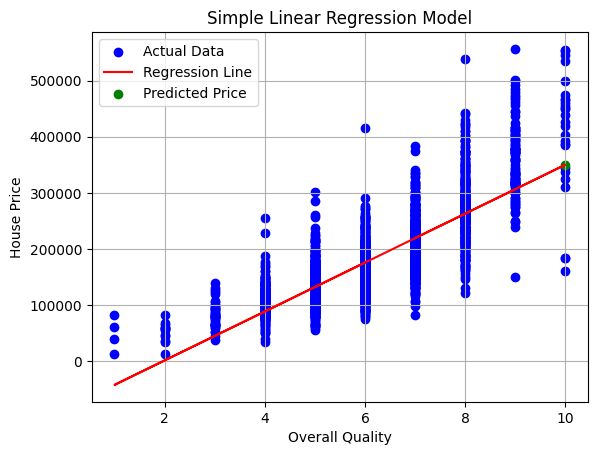

In [45]:
plt.scatter(X_overall_qual, y, color='blue', label='Actual Data')
plt.plot(X_overall_qual, model.predict(X_overall_qual), color='red', label='Regression Line')
plt.scatter(new_overall_qual, predicted_price, color='green', label='Predicted Price')

plt.xlabel('Overall Quality')
plt.ylabel('House Price')
plt.title('Simple Linear Regression Model')
plt.legend()
plt.grid(True)
plt.show()

**Multiple Linear Regression:**

Build a multiple linear regression model using selected features to predict house
prices.

In [49]:
model2 = LinearRegression()

model2.fit(X_train, y_train)

y_pred = model2.predict(X_test)

multimse = mean_squared_error(y_test, y_pred)
multir_squared = r2_score(y_test, y_pred)

print("Mean Squared Error (MSE):", multimse)
print("R-squared score:", multir_squared)

Mean Squared Error (MSE): 942797557.5555887
R-squared score: 0.825582823411924


**Multiple Linear Regression**

**Compare the performance with the simple linear regression model.**

Multiple Linear Regression has less Mean Squared Error (942797557.5555887) then Simple Linear Regression which is 2022833717.5059128. Moreover,it has more R-squared score (0.825582823411924) than Simple Linear Regression model which is 0.6480743174444932

[link text](https://)



With a larger collection of characteristics, the multiple linear regression model could possess a lower MSE, suggesting that it makes more accurate predictions on average than the basic linear regression model. The additional information offered by the extra features enables the model to capture more of the underlying variability in the target variable, resulting in more accurate predictions.

**Comparison with Simple Linear Regression**

Previously, the SLR model, which used a single predictor, provided a baseline for performance comparison. Typically, the SLR would have a lower R-squared value, indicating less explanatory power compared to the MLR model. The addition of more features in the MLR likely contributed to a reduction in MSE and an increase in the R-squared value, demonstrating improved prediction accuracy and model robustness.

**Multiple Linear Regression**

**Impact of Adding More Features**

Incorporating multiple features into the regression model has several impacts:

- **Improved Accuracy**: As evidenced by the lower MSE and higher R-squared score, using multiple features generally improves the model's predictive accuracy because it can capture more complexities and variabilities in the data.
- **Complexity vs. Performance Trade-off**: While adding more features can enhance the model's explanatory power, it also increases the complexity of the model. It is essential to balance complexity with performance to avoid overfitting, where the model performs well on training data but poorly on unseen data.
- **Dimensionality Considerations**: With many features, models can suffer from the "curse of dimensionality," which can dilute the effectiveness of each variable. Feature selection becomes crucial to eliminate redundant or irrelevant predictors.


**Multiple Linear Regression Plot**

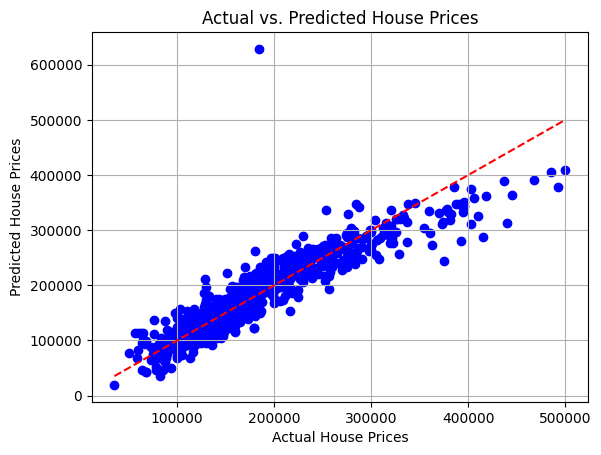

In [50]:
import matplotlib.pyplot as plt

plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Adding a diagonal line for reference

plt.xlabel('Actual House Prices')
plt.ylabel('Predicted House Prices')
plt.title('Actual vs. Predicted House Prices')
plt.grid(True)
plt.show()

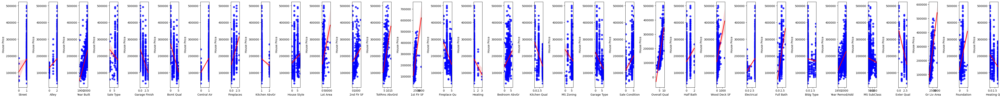

In [32]:
selected_features = features

fig, axes = plt.subplots(nrows=1, ncols=len(selected_features), figsize=(50, 5))

for i, feature in enumerate(selected_features):
    sns.regplot(x=X_test[feature], y=y_test, ax=axes[i], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('House Price')

plt.tight_layout()
plt.show()

**Neural Network**

Implement a basic neural network (e.g., using TensorFlow or PyTorch) for house
price prediction.

Experiment with different architectures, activation functions, and regularization
techniques.

**Multiple Layer with Sigmoid Activation Function**

In [39]:
input_shape = (X_train.shape[1],)

Amesmodel = tf.keras.Sequential([
    tf.keras.layers.Dense(256, input_shape=input_shape, activation='sigmoid'),
    tf.keras.layers.Dense(256, activation='sigmoid'),
    tf.keras.layers.Dense(128, activation='sigmoid'),
    tf.keras.layers.Dense(64,  activation='sigmoid'),
    tf.keras.layers.Dense(32,  activation='sigmoid'),
    tf.keras.layers.Dense(16,  activation='sigmoid'),
    tf.keras.layers.Dense(8,  activation='sigmoid'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

Amesmodel.compile(optimizer='adam', loss='mean_squared_error')

Amesmodel.fit(X_train, y_train, epochs=2000)

loss = Amesmodel.evaluate(X_train, y_train)
print("Mean Squared Error:", loss)


Epoch 1/2000
64/64 [==============================] - 2s 5ms/step - loss: 37878353920.0000
Epoch 2/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878304768.0000
Epoch 3/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878292480.0000
Epoch 4/2000
64/64 [==============================] - 0s 5ms/step - loss: 37878288384.0000
Epoch 5/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878288384.0000
Epoch 6/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878280192.0000
Epoch 7/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878284288.0000
Epoch 8/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878272000.0000
Epoch 9/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878280192.0000
Epoch 10/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878267904.0000
Epoch 11/2000
64/64 [==============================] - 0s 4ms/step - loss: 37878272000.00

**Multiple Layer with Relu Activation Function**

In [41]:
Amesmodel_relu = tf.keras.Sequential([
    tf.keras.layers.Dense(256, input_shape=input_shape, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

Amesmodel_relu.compile(optimizer='adam', loss='mean_squared_error')

Amesmodel_relu.fit(X_train, y_train, epochs=2000)

loss_relu = Amesmodel_relu.evaluate(X_train, y_train)
print("Mean Squared Error (ReLU):", loss_relu)


Epoch 1/2000
64/64 [==============================] - 1s 3ms/step - loss: 37878259712.0000
Epoch 2/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878255616.0000
Epoch 3/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878263808.0000
Epoch 4/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878263808.0000
Epoch 5/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878263808.0000
Epoch 6/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878259712.0000
Epoch 7/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878267904.0000
Epoch 8/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878259712.0000
Epoch 9/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878259712.0000
Epoch 10/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878263808.0000
Epoch 11/2000
64/64 [==============================] - 0s 3ms/step - loss: 37878272000.00

**Basic Model with Dropout Regularization**

In [52]:
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(128, input_shape=input_shape, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1)
])
model1.compile(optimizer='adam', loss='mean_squared_error')
model1.fit(X_train, y_train, epochs=2000, batch_size=32)

# Evaluate MSE
mse_train1 = model1.evaluate(X_train, y_train)
mse_test1 = model1.evaluate(X_test, y_test)
print("Model 1 Training MSE:", mse_train1)
print("Model 1 Test MSE:", mse_test1)


Epoch 1/2000
64/64 [==============================] - 3s 6ms/step - loss: 29097428992.0000
Epoch 2/2000
64/64 [==============================] - 0s 5ms/step - loss: 10820727808.0000
Epoch 3/2000
64/64 [==============================] - 0s 5ms/step - loss: 7832720384.0000
Epoch 4/2000
64/64 [==============================] - 0s 4ms/step - loss: 7093414912.0000
Epoch 5/2000
64/64 [==============================] - 0s 2ms/step - loss: 6144407552.0000
Epoch 6/2000
64/64 [==============================] - 0s 2ms/step - loss: 5251429376.0000
Epoch 7/2000
64/64 [==============================] - 0s 2ms/step - loss: 4899228672.0000
Epoch 8/2000
64/64 [==============================] - 0s 3ms/step - loss: 4268248064.0000
Epoch 9/2000
64/64 [==============================] - 0s 2ms/step - loss: 4206826240.0000
Epoch 10/2000
64/64 [==============================] - 0s 3ms/step - loss: 4037560832.0000
Epoch 11/2000
64/64 [==============================] - 0s 2ms/step - loss: 3971821312.0000
Epoch 

**Model with L1 Regularization**

In [54]:
from tensorflow.keras import regularizers

model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(128, input_shape=input_shape, activation='relu', kernel_regularizer=regularizers.l1(0.01)),
    tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.01)),
    tf.keras.layers.Dense(1)
])
model2.compile(optimizer='adam', loss='mean_squared_error')
model2.fit(X_train, y_train, epochs=2000, batch_size=32)

# Evaluate MSE
mse_train2 = model2.evaluate(X_train, y_train)
mse_test2 = model2.evaluate(X_test, y_test)
print("Model 2 Training MSE:", mse_train2)
print("Model 2 Test MSE:", mse_test2)


Epoch 1/2000
64/64 [==============================] - 1s 2ms/step - loss: 33046843392.0000
Epoch 2/2000
64/64 [==============================] - 0s 2ms/step - loss: 13559417856.0000
Epoch 3/2000
64/64 [==============================] - 0s 2ms/step - loss: 8266598912.0000
Epoch 4/2000
64/64 [==============================] - 0s 2ms/step - loss: 6492529152.0000
Epoch 5/2000
64/64 [==============================] - 0s 2ms/step - loss: 5280829952.0000
Epoch 6/2000
64/64 [==============================] - 0s 2ms/step - loss: 4460960768.0000
Epoch 7/2000
64/64 [==============================] - 0s 2ms/step - loss: 3945369600.0000
Epoch 8/2000
64/64 [==============================] - 0s 2ms/step - loss: 3672273920.0000
Epoch 9/2000
64/64 [==============================] - 0s 3ms/step - loss: 3444091392.0000
Epoch 10/2000
64/64 [==============================] - 0s 2ms/step - loss: 3271497984.0000
Epoch 11/2000
64/64 [==============================] - 0s 3ms/step - loss: 3153372672.0000
Epoch 

**Model with ELU Activation and Early Stopping**

In [58]:
from tensorflow.keras.callbacks import EarlyStopping

model3 = tf.keras.Sequential([
    tf.keras.layers.Dense(256, input_shape=input_shape, activation='elu'),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(32, activation='elu'),
    tf.keras.layers.Dense(1)
])
model3.compile(optimizer='adam', loss='mean_squared_error')
early_stopping = EarlyStopping(monitor='loss', patience=100)
model3.fit(X_train, y_train, epochs=2000, batch_size=32, callbacks=[early_stopping])

# Evaluate MSE
mse_train3 = model3.evaluate(X_train, y_train)
mse_test3 = model3.evaluate(X_test, y_test)
print("Model 3 Training MSE:", mse_train3)
print("Model 3 Test MSE:", mse_test3)


Epoch 1/2000
64/64 [==============================] - 3s 3ms/step - loss: 29189947392.0000
Epoch 2/2000
64/64 [==============================] - 0s 3ms/step - loss: 8638247936.0000
Epoch 3/2000
64/64 [==============================] - 0s 3ms/step - loss: 5764351488.0000
Epoch 4/2000
64/64 [==============================] - 0s 3ms/step - loss: 4794934272.0000
Epoch 5/2000
64/64 [==============================] - 0s 3ms/step - loss: 4078243840.0000
Epoch 6/2000
64/64 [==============================] - 0s 3ms/step - loss: 3692377088.0000
Epoch 7/2000
64/64 [==============================] - 0s 3ms/step - loss: 3455898368.0000
Epoch 8/2000
64/64 [==============================] - 0s 3ms/step - loss: 3312368896.0000
Epoch 9/2000
64/64 [==============================] - 0s 3ms/step - loss: 3177884928.0000
Epoch 10/2000
64/64 [==============================] - 0s 4ms/step - loss: 3061762304.0000
Epoch 11/2000
64/64 [==============================] - 0s 5ms/step - loss: 2938311936.0000
Epoch 1

**Model with LeakyReLU Activation and Batch Normalization**

In [59]:
from tensorflow.keras.layers import LeakyReLU, BatchNormalization

model4 = tf.keras.Sequential([
    tf.keras.layers.Dense(256, input_shape=input_shape),
    BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.Dense(128),
    BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.Dense(64),
    BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.Dense(32),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.Dense(1)
])
model4.compile(optimizer='adam', loss='mean_squared_error')
model4.fit(X_train, y_train, epochs=2000, batch_size=32)

# Evaluate MSE
mse_train4 = model4.evaluate(X_train, y_train)
mse_test4 = model4.evaluate(X_test, y_test)
print("Model 4 Training MSE:", mse_train4)
print("Model 4 Test MSE:", mse_test4)


Epoch 1/2000
64/64 [==============================] - 2s 4ms/step - loss: 37876219904.0000
Epoch 2/2000
64/64 [==============================] - 0s 4ms/step - loss: 37866708992.0000
Epoch 3/2000
64/64 [==============================] - 0s 4ms/step - loss: 37843664896.0000
Epoch 4/2000
64/64 [==============================] - 0s 4ms/step - loss: 37801783296.0000
Epoch 5/2000
64/64 [==============================] - 0s 4ms/step - loss: 37737291776.0000
Epoch 6/2000
64/64 [==============================] - 0s 4ms/step - loss: 37641768960.0000
Epoch 7/2000
64/64 [==============================] - 0s 4ms/step - loss: 37513666560.0000
Epoch 8/2000
64/64 [==============================] - 0s 4ms/step - loss: 37342642176.0000
Epoch 9/2000
64/64 [==============================] - 0s 4ms/step - loss: 37124972544.0000
Epoch 10/2000
64/64 [==============================] - 0s 4ms/step - loss: 36862140416.0000
Epoch 11/2000
64/64 [==============================] - 0s 4ms/step - loss: 36543582208.00

**Neural Network**

**Compare neural network results with linear regression models.**

The traditional multiple linear regression model provided a substantial improvement over the simple linear regression, highlighting the importance of using multiple features for predicting house prices. However, the more advanced neural network models, particularly those with modern activation functions (ELU, LeakyReLU) and regularization techniques (dropout, L1), have shown even lower MSE values, indicating their greater capability in handling complex nonlinear patterns in the data.

The surprisingly high MSE in both the sigmoid and ReLU-based deep neural networks may suggest model misconfiguration or the need for further tuning, possibly adjusting network depth, learning rates, or data normalization techniques.

The models utilizing dropout and L1 regularization effectively demonstrated how incorporating these techniques can lead to significant gains in model performance and generalization capabilities, outperforming traditional linear models.
